# Plotting in with Pandas and Matplotlib


In this tutorial, we'll swiftly review the creation of various charts covered in our course lectures, including boxplots, histogram charts, barcharts, and more. While it's possible to generate simple plots directly from [pandas](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html) (you can practice for yourself), for finer control over multiple aspects of these plots, we'll explore the utilization of the [Matplotlib](https://matplotlib.org/stable/gallery/index.html) plotting module. Matplotlib stands out for its remarkable power and flexibility, as we'll demonstrate throughout this tutorial.

Python has many nice, useful libraries that can be used for plotting.
some of the most popular are as follows:
    
1. [matplotlib](https://matplotlib.org/): matplotlib is a python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms. matplotlib can be used in python scripts, the python and ipython shell, web application servers, and six graphical user interface toolkits.

2. [seaborn](https://seaborn.pydata.org/): Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

3. [plotly](https://plot.ly/python/): Plotly's Python graphing library makes interactive, publication-quality graphs online. Examples of how to make line plots, scatter plots, area charts, bar charts, error bars, box plots, histograms, heatmaps, subplots, multiple-axes, polar charts, and bubble charts.

4. [bokeh](https://bokeh.pydata.org/en/latest/): Bokeh is a Python interactive visualization library that targets modern web browsers for presentation. Its goal is to provide elegant, concise construction of novel graphics in the style of D3.js, and to extend this capability with high-performance interactivity over very large or streaming datasets.

5. [ggplot](http://ggplot.yhathq.com/): ggplot is a plotting system for Python based on R's ggplot2 and the Grammar of Graphics. It is built for making profressional looking, plots quickly with minimal code.

6. [holoviews](http://holoviews.org/): HoloViews is an open-source Python library designed to make data analysis and visualization seamless and simple. With HoloViews, you can usually express what you want to do in very few lines of code, letting you focus on what you are trying to explore and convey, not on the process of plotting.


```{note}

Explore the galleries and examples of different visualization libraries above to learn what’s possible to do in Python.

```

# Anatomy of a Plot

Before visualizing our data on a plot, let's understand the components of a plot. We won't delve into the details of different plot types in this tutorial but provide a brief introduction to various plots that can be created using Python and the essential elements of a plot.

Here is a list of several types of plots used to represent different kinds of data:

- [Bar Chart](https://en.wikipedia.org/wiki/Bar_chart)
- [Histogram](https://en.wikipedia.org/wiki/Histogram)
- [Scatter Plot](https://en.wikipedia.org/wiki/Scatter_plot)
- [Line Chart](https://en.wikipedia.org/wiki/Line_chart)
- [Pie Chart](https://en.wikipedia.org/wiki/Pie_chart)
- [Box Plot](https://en.wikipedia.org/wiki/Box_plot)
- [Violin Plot](https://en.wikipedia.org/wiki/Violin_plot)
- [Dendrogram](https://en.wikipedia.org/wiki/Dendrogram)
- [Chord Diagram](https://en.wikipedia.org/wiki/Chord_diagram_(information_visualization))
- [Treemap](https://en.wikipedia.org/wiki/Treemap)
- [Network Chart](https://en.wikipedia.org/wiki/Network_chart)

Despite the variety, most plots share common elements. Understanding basic terminology helps when creating or modifying plots. The figure below illustrates elements of a basic line plot.

![Basic elements of a plot](img/basic-elements-of-plot.png)
*Basic elements of a plot. (source: https://geo-python-site.readthedocs.io/en/latest/lessons/L7/plot-anatomy.html)*


## Common Plotting Terms

These terms may vary slightly depending on the plotting library, and for this list, we use typical Matplotlib terms.

| Term         | Description                                                                                    |
|--------------|-----------------------------------------------------------------------------------------------|
| *Axis*       | Graph axes, typically x, y, and z for 3D plots.                                               |
| *Title*      | Title of the plot.                                                                            |
| *Label*      | Name for the axis (e.g., xlabel or ylabel).                                                   |
| *Legend*     | Legend for the plot.                                                                          |
| *Tick Label* | Text or values represented on the axis.                                                       |
| *Symbol*     | Symbol for data point(s) on a scatter plot, presented with different shapes/colors.           |
| *Size*       | Size of a point on a scatter plot, also used for text sizes on a plot.                         |
| *Linestyle*  | The style of how the line should be drawn, solid or dashed, for example.                        |
| *Linewidth*  | The width of a line on a plot.                                                                |
| *Alpha*      | Transparency level of a filled element in a plot (values between 0.0 and 1.0).                 |
| *Tick(s)*    | Refers to the tick marks on a plot.                                                          |
| *Annotation* | Text added to a plot.                                                                        |
| *Padding*    | The distance between an (axis/tick) label and the axis.                                      |


In [1]:
import warnings
warnings.filterwarnings("ignore")

## Getting started

Let's start by importing pandas and matplotlib

In [2]:
# import required libraries

import pandas as pd
import matplotlib.pyplot as plt


## Input data: Community Crime Statistics Map

Our input data in this tutorial is a text file containing Building Permits by Community map in city of Calgary, Alberta, Canda retrieved from [City of Calgary Open Data Portal](https://data.calgary.ca/browse?limitTo=datasets):

- File name: [Building_Permits_20240122.csv] 
- You can download the data from the link provided: [City of Calgary Open Data Portal](https://data.calgary.ca/Business-and-Economic-Activity/Building-Permits-by-Community/kr8b-c44i)
- Data is provides Building permit applications made to The City of Calgary's Planning & Development department in 2023.
- There are totally 22,073 rows and 30 columns in this dataset.

In [3]:
data = pd.read_csv('Building_Permits_20240122.csv')

In [4]:
data.head()

,PermitNum,StatusCurrent,AppliedDate,IssuedDate,CompletedDate,PermitType,PermitTypeMapped,PermitClass,PermitClassGroup,PermitClassMapped,...,CommunityCode,CommunityName,Latitude,Longitude,LocationCount,LocationTypes,LocationAddresses,LocationsWKT,LocationsGeoJSON,Point
0,BP2023-00001,Cancelled,2023/01/01,NaN,2023/08/04,Commercial / Multi Family Project,Building,3106 - Retail Shop,Commercial,Non-Residential,...,SNA,SUNALTA,51.037938,-114.095388,2.0,Titled Parcel;Building,1438 17 AV SW;1438 17 AV SW,MULTIPOINT (-114.09538783812974 51.03793752506...,"{""type"":""MultiPoint"",""coordinates"":[[-114.0953...",POINT (-114.09538783812974 51.03793752506271)
1,BP2023-00002,Completed,2023/01/01,2023/01/24,2023/06/22,Residential Improvement Project,Building,1301 - Private Detached Garage,Garage,Residential,...,WWO,WOLF WILLOW,50.874928,-114.009338,2.0,Titled Parcel;Building,223 WOLF CREEK AV SE;223 WOLF CREEK AV SE,MULTIPOINT (-114.00933819969845 50.87492753090...,"{""type"":""MultiPoint"",""coordinates"":[[-114.0093...",POINT (-114.00933819969845 50.874927530904024)
2,BP2023-00016,Completed,2023/01/02,2023/01/02,2023/05/12,Demolition,Demolition,1106 - House,Single Family,Residential,...,BRD,BRIDGELAND/RIVERSIDE,51.053518,-114.039212,1.0,Titled Parcel,205 9A ST NE,POINT (-114.03921222082343 51.05351846849098),"{""type"":""Point"",""coordinates"":[-114.0392122,51...",POINT (-114.03921222082343 51.05351846849098)
3,BP2023-00015,Completed,2023/01/02,2023/01/03,2023/11/16,Residential Improvement Project,Building,1301 - Private Detached Garage,Garage,Residential,...,DAL,DALHOUSIE,51.108398,-114.147277,2.0,Titled Parcel;Building,6204 DALBEATTIE HL NW;6204 DALBEATTIE HL NW,MULTIPOINT (-114.1472766668805 51.108397819725...,"{""type"":""MultiPoint"",""coordinates"":[[-114.1472...",POINT (-114.1472766668805 51.10839781972519)
4,BP2023-00010,Issued Permit,2023/01/02,2023/01/03,NaN,Residential Improvement Project,Building,1101 - Basement Development,Single Family,Residential,...,SHN,SHAWNESSY,50.908529,-114.095202,2.0,Titled Parcel;Building,72 SHAWBROOKE MR SW;72 SHAWBROOKE MR SW,MULTIPOINT (-114.09520199036152 50.90852910976...,"{""type"":""MultiPoint"",""coordinates"":[[-114.0952...",POINT (-114.09520199036152 50.90852910976423)


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22073 entries, 0 to 22072
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   PermitNum          22073 non-null  object 
 1   StatusCurrent      22073 non-null  object 
 2   AppliedDate        22073 non-null  object 
 3   IssuedDate         19574 non-null  object 
 4   CompletedDate      10433 non-null  object 
 5   PermitType         22073 non-null  object 
 6   PermitTypeMapped   22073 non-null  object 
 7   PermitClass        22072 non-null  object 
 8   PermitClassGroup   22073 non-null  object 
 9   PermitClassMapped  22073 non-null  object 
 10  WorkClass          22073 non-null  object 
 11  WorkClassGroup     22073 non-null  object 
 12  WorkClassMapped    21533 non-null  object 
 13  Description        20973 non-null  object 
 14  ApplicantName      13679 non-null  object 
 15  ContractorName     13282 non-null  object 
 16  HousingUnits       220

### Quickly clean the data and remove unnecessary information

In [38]:
# keep only the columns we need

data = data[['PermitNum', 'StatusCurrent', 'AppliedDate', 'IssuedDate', 'CompletedDate', 'PermitType', 'PermitClass', 'PermitClassGroup', 'WorkClassGroup', 'HousingUnits', 'EstProjectCost', 'CommunityCode', 'Latitude', 'Longitude', 'LocationCount']]

data.head()

,PermitNum,StatusCurrent,AppliedDate,IssuedDate,CompletedDate,PermitType,PermitClass,PermitClassGroup,WorkClassGroup,HousingUnits,EstProjectCost,CommunityCode,Latitude,Longitude,LocationCount
1,BP2023-00002,Completed,2023-01-01,2023/01/24,2023/06/22,Residential Improvement Project,1301 - Private Detached Garage,Garage,New,0,42530.0,WWO,50.874928,-114.009338,2.0
3,BP2023-00015,Completed,2023-01-02,2023/01/03,2023/11/16,Residential Improvement Project,1301 - Private Detached Garage,Garage,New,0,46291.0,DAL,51.108398,-114.147277,2.0
4,BP2023-00010,Issued Permit,2023-01-02,2023/01/03,NaN,Residential Improvement Project,1101 - Basement Development,Single Family,Improvement,0,56141.0,SHN,50.908529,-114.095202,2.0
6,BP2023-00006,Completed,2023-01-02,2023/01/04,2023/08/21,Single Construction Permit,1106 - Single Family House,Single Family,New,1,392655.0,HSN,51.110010,-114.269878,2.0
7,BP2023-00004,Completed,2023-01-02,2023/01/02,2023/06/26,Residential Improvement Project,1110 - Below Grade Suite,Secondary Suites,Improvement,1,65498.0,CNS,51.148098,-113.931561,3.0


In [7]:
# how many null values are there?   

data.isnull().sum()

PermitNum               0
StatusCurrent           0
AppliedDate             0
IssuedDate           2499
CompletedDate       11640
PermitType              0
PermitClass             1
PermitClassGroup        0
WorkClassGroup          0
HousingUnits            0
EstProjectCost       2461
CommunityCode           7
Latitude                0
Longitude               0
LocationCount           7
dtype: int64

As in the next steps we want to plot the total project costs, we need them to be complete. So we remove all the rows with missing `EstProjectCost`.

In [8]:
# remove rows with null values in the EstProjectCost column

data = data.dropna(subset=['EstProjectCost'])

# how many null values are there now?

data.isnull().sum()

PermitNum               0
StatusCurrent           0
AppliedDate             0
IssuedDate           1592
CompletedDate       10781
PermitType              0
PermitClass             0
PermitClassGroup        0
WorkClassGroup          0
HousingUnits            0
EstProjectCost          0
CommunityCode           6
Latitude                0
Longitude               0
LocationCount           6
dtype: int64

Convert the `AppliedDate` column to `datetime` format so afterward we can work with time data

In [9]:
# convert the AppliedDate columns to datetime format
data['AppliedDate'] = pd.to_datetime(data['AppliedDate'])


## Explatory Analysis by plotting charts

Now lets try to create some charts to get more familiar with thr data and get more insights about different stats of data

### Line Chart

In the first step we want to draw a line chart to see how many building permits have been issued in each day. 

We proceed to extract the date component from the `'AppliedDate'` column and count the number of rows for each unique date. The `groupby()` method groups the DataFrame by the date component, and `size()` function counts the number of rows for each unique date. We then use `reset_index()` to reset the index of the resulting DataFrame and `name='permit_count'` to assign a new name to the count column.


In [20]:
# Create a new column called Datetime that contains only the date portion of the AppliedDate column

data['Date_daily'] = data['AppliedDate'].dt.date

# Group the data by Date_daily and count the number of rows in each group
daily_counts = data.groupby(data['Date_daily']).size()

# reset the index of the daily_counts dataframe and name the columns permit_count
daily_counts = daily_counts.reset_index(name='permit_count')



In [22]:
daily_counts.head()

,Date_daily,permit_count
0,2023-01-01,1
1,2023-01-02,17
2,2023-01-03,44
3,2023-01-04,40
4,2023-01-05,43


We initialize a Matplotlib figure with `plt.figure(figsize=(12, 6))`, setting the size to 12 inches in width and 6 inches in height. This helps in controlling the visual aspect of our plot.

Using `plt.plot()`, we create a line chart. The `'Date_daily'` column is plotted on the x-axis, and the `'permit_count'` column is plotted on the y-axis. We specify the line style, markers, and color to customize the appearance of the plot.


```{note}

We set labels for the x-axis ('Date') and y-axis ('Number of Permits'). Additionally, we provide a title for the plot using `plt.xlabel()`, `plt.ylabel()`, and `plt.title()`.

To improve the readability of the x-axis labels, we rotate them by 90 degrees using `plt.xticks(rotation=90)`.

Finally, we display the plot using `plt.show()`. 

```

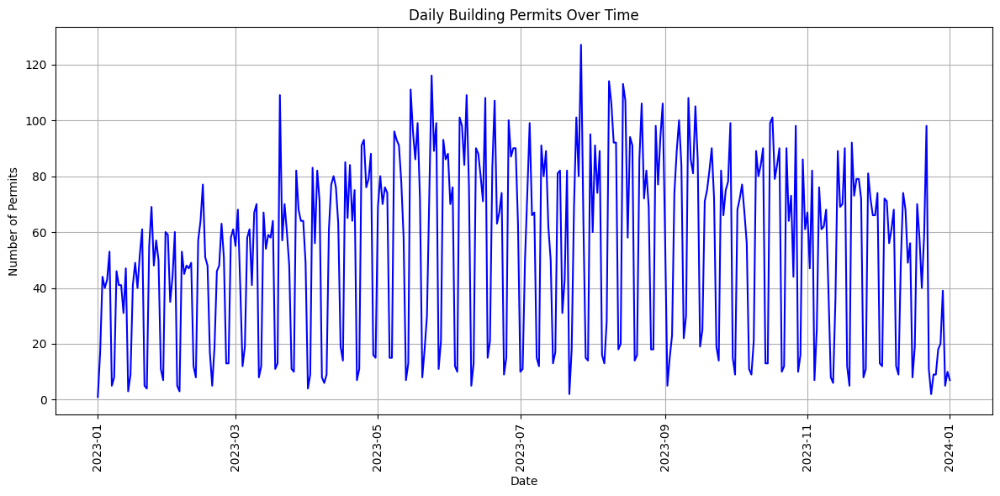

In [27]:
# Plotting with Matplotlib
plt.figure(figsize=(12, 6))  # Set the size of the figure


# Plotting the line chart
plt.plot(daily_counts['Date_daily'], daily_counts['permit_count'], linestyle='-', color='blue')


# Setting labels and title
plt.xlabel('Date')
plt.ylabel('Number of Permits')
plt.title('Daily Building Permits Over Time')

# Rotating x-axis labels for better readability
plt.xticks(rotation=90)

# Adding grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()  # Adjust layout for better appearance

# Display the plot
plt.show()

### Bar Chart

In the next step we try to draw a bar chart to check how many permit have been issued for each Permit Class Group.

As before, we use `groupby()` to group the DataFrame by the `'PermitClassGroup'` column and calculate the size (number of rows) for each class group. Similarly, `reset_index()` is used to reset the index and name='Count' assigns a new name to the count column.

In [28]:
# Extract date and count the number of rows for each category
category_counts = data.groupby('PermitClassGroup').size().reset_index(name='Count')

# show the category_counts dataframe
category_counts.head()

,PermitClassGroup,Count
0,Additional Dwelling,97
1,Apartment,353
2,Commercial,2119
3,Garage,2633
4,General,91


To create a meaningful bar plot, we sort the DataFrame in descending order based on the 'Count' column. 

In [29]:
# Sorting the DataFrame by 'Count' in descending order
category_counts = category_counts.sort_values(by='Count', ascending=False)

# show the category_counts dataframe
category_counts.head()


,PermitClassGroup,Count
10,Single Family,9642
3,Garage,2633
2,Commercial,2119
9,Secondary Suites,1655
14,Two Family,1213


The bar plot is then generated using `plt.bar()`. We use `'PermitClassGroup'` on the x-axis and `'Count'` on the y-axis

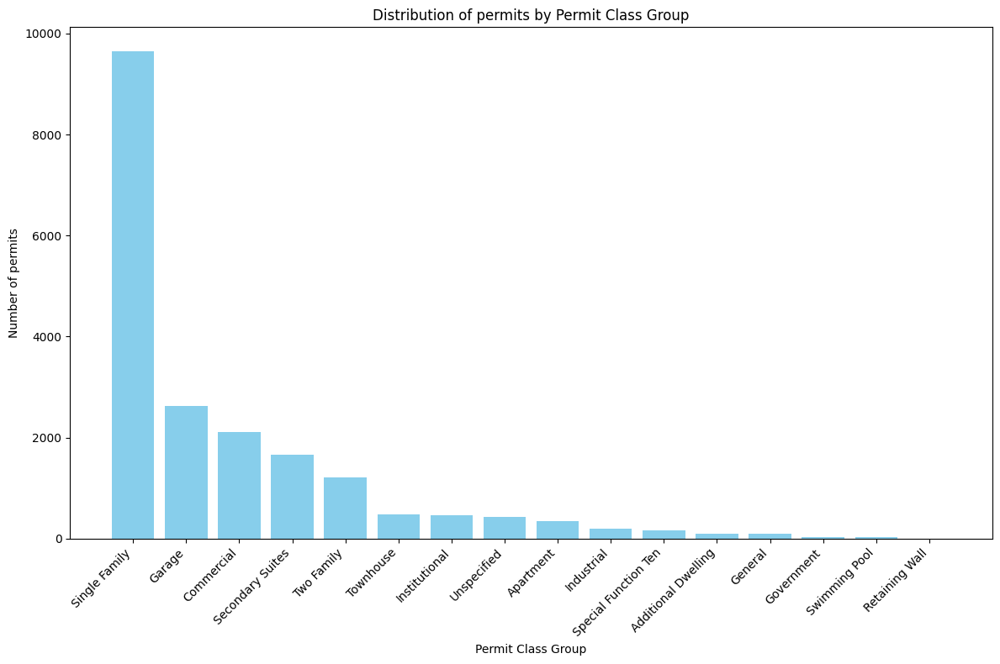

In [30]:
# Plotting with Matplotlib
plt.figure(figsize=(12, 8))  # Set the size of the figure

# Creating a bar plot
plt.bar(category_counts['PermitClassGroup'], category_counts['Count'], color='skyblue')

# Setting labels and title
plt.xlabel('Permit Class Group')
plt.ylabel('Number of permits')
plt.title('Distribution of permits by Permit Class Group')

# Rotating x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()

## Pie Chart

Now let's practice Pie chart. 

We want to check the type of permit `'WorkClassGroup'` to check whether the permit is for improvement of new building.
To do so, same as before we use `groupby()` to group the dataframe based on `'WorkClassGroup'` and then count the number of permit in each group.

In [83]:
# group data by WorkClassGroup and count the number of rows in each group
workclass_counts = data.groupby('WorkClassGroup').size().reset_index(name='Count')

# show the workclass_counts dataframe
workclass_counts.head()

,WorkClassGroup,Count
0,Improvement,9440
1,New,9662
2,Unspecified,510


Like before, we use matplotlib to plot the pir chart.

In piechart we can set different stting such as, legend, labels forn size and weight, ...

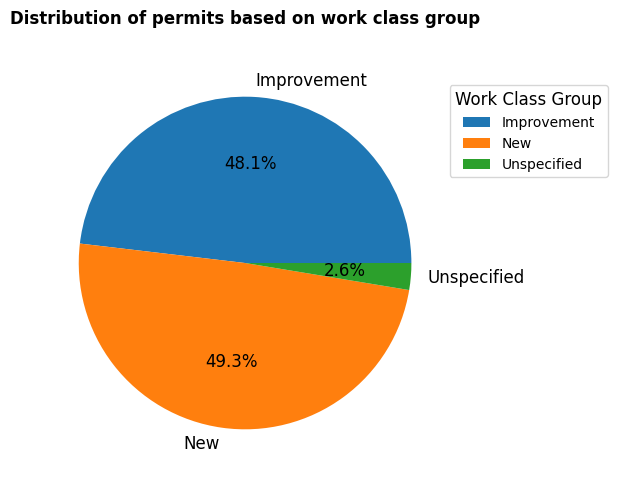

In [93]:
# Plotting with Matplotlib
plt.figure(figsize=(6, 6))  # Set the size of the figure

# Creating a pie chart with various setups
labels = workclass_counts['WorkClassGroup']

# Setting custom colors, autopct format, and shadow
plt.pie(workclass_counts['Count'], 
        autopct='%1.1f%%', # 1 decimal place for percentage
        textprops={'fontsize': 12}, # Setting fontsize of text labels
        radius=0.9, # Setting the radius of the pie chart
        labels=labels, # Setting the labels for each section
        )

# Setting title
plt.title('Distribution of permits based on work class group', fontsize=12, fontweight='bold')

# Adding legend with custom position
plt.legend(labels, loc='upper right', bbox_to_anchor=(1.3, 0.9), title='Work Class Group', title_fontsize=12)

# Display the plot
plt.show()

### Historgram

We can use histogram chart to check the distribution of `'EstProjectCost'` to see how the project prices are distributed.

Histogram plot divides the data into `bins` and displays the `frequency` (or count) of values within each bin.

We use `plt.hist()` to create the histogram.

The `data['EstProjectCost']` variable contains the data we want to visualize.

- `'bins'` parameter controls the number of bins in the histogram.
- `'color'` parameter sets the color of the bars.
- `'edgecolor'` parameter sets the color of the edges of the bars. -->

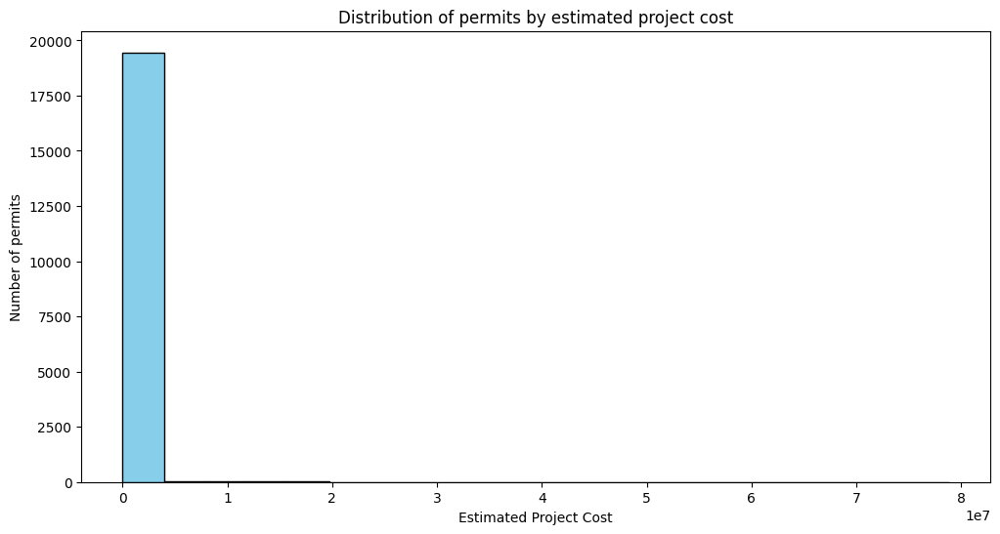

In [123]:
# plot histogram of the EstProjectCost column
plt.figure(figsize=(12, 6))  # Set the size of the figure


# Plotting the histogram
plt.hist(data['EstProjectCost'], 
         bins=20, 
         color='skyblue', 
         edgecolor='black')

# Setting labels and title
plt.xlabel('Estimated Project Cost')
plt.ylabel('Number of permits')
plt.title('Distribution of permits by estimated project cost')

# Display the plot
plt.show()

```{note}

As we can see, the plot does not show very good result due to the x-axis that contains sparse data (some of the prices are around 80,000,000 which are only few and make the chart not readable. One approach is that filter the dataframe to less sparse prices. For example we choose to keep those rows that contain price less than 200,000)

We also can play with number of bins to have better chart. Let's change number of bins to 200.

```

In [135]:
# filter the data to keep only rows where EstProjectCost is less than 2,000,000
data_less_than_2000000 = data[data['EstProjectCost'] < 2000000]

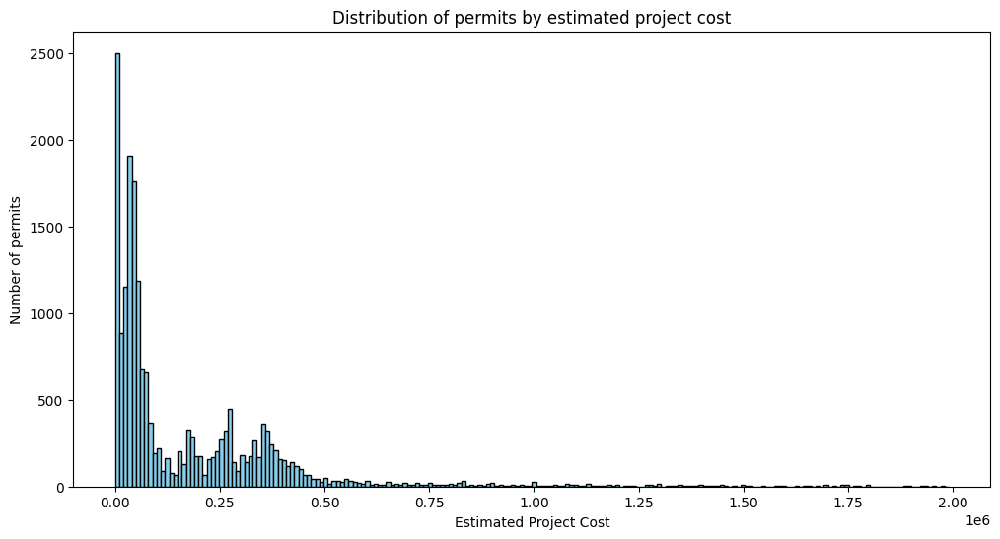

In [128]:
# plot histogram of the EstProjectCost column
plt.figure(figsize=(12, 6))  # Set the size of the figure


# Plotting the histogram
plt.hist(data_less_than_2000000['EstProjectCost'], 
         bins=200, 
         color='skyblue', 
         edgecolor='black')

# Setting labels and title
plt.xlabel('Estimated Project Cost')
plt.ylabel('Number of permits')
plt.title('Distribution of permits by estimated project cost')

# Display the plot
plt.show()

### Box Plot

Lets look at the distribution of the EstProjectCost column using a boxplot

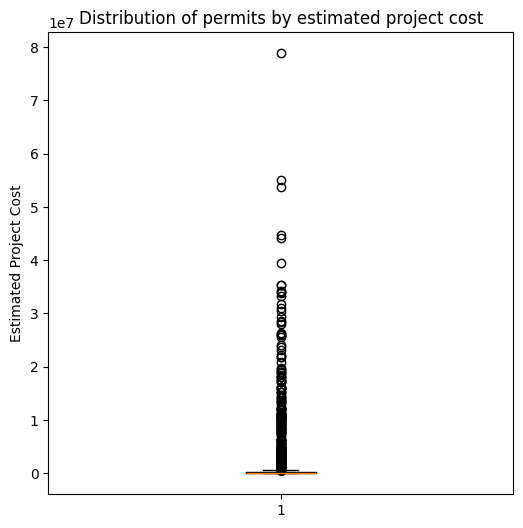

In [136]:
# Boxplot of the EstProjectCost column

plt.figure(figsize=(6, 6))  # Set the size of the figure

# Plotting the boxplot
plt.boxplot(data['EstProjectCost'])

# Setting labels and title
plt.ylabel('Estimated Project Cost')
plt.title('Distribution of permits by estimated project cost')

# Display the plot
plt.show()

As we can see, the number of outliars is too much and make the plot not readable. We can use showfliers=False to hide the outliars.


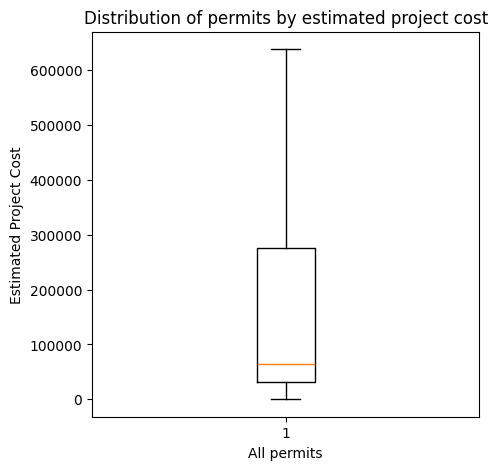

In [138]:
# Boxplot of the EstProjectCost column

plt.figure(figsize=(5, 5))  # Set the size of the figure

# Plotting the boxplot
plt.boxplot(data['EstProjectCost'],
            showfliers=False,
            )

# Setting labels and title
plt.ylabel('Estimated Project Cost')
plt.xlabel('All permits')
plt.title('Distribution of permits by estimated project cost')

# Display the plot
plt.show()

## Map Visualization

Now let's see how to plot latitude and longitude points on a Folium map.


Folium is the primary library for creating interactive maps. Let's start with importing required libraries

In [139]:
import folium

Next, we calculate the center of the map using the mean of latitude and longitude values.

In [141]:
# Calculate the center of the map
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]

# print the map_center variable
print(map_center)

[51.02548747000798, -114.01941494735246]


Then, we create the Folium map, specifying the initial zoom level, and the center of the map.

In [142]:
# Create the Folium map
my_map = folium.Map(location=map_center, zoom_start=10)

In this step, we iterate through each row in the DataFrame (see the example in the [Processing data with pandas](https://engo645-assignments.readthedocs.io/en/latest/notebooks/L2/using_pandas.html#iterating-over-rows)) and add a `Circle Marker` for each point on the map. We can customize the appearance of the Circle Marker using parameters like `radius`, `color`, `fill`, `fill_color`, and `fill_opacity`. The popup displays information about each point.


```{note}

We use the first 10,000 rows and show the first 10,000 points one the map to avoid making the map heavy and crashing the PC!
```

In [143]:
import folium # map rendering library

f = folium.Figure(width=800, height=500) # set figure size

# set map center and zoom level on Calgary
m = folium.Map(location=[51.0447, -114.0719], zoom_start=12).add_to(f) # add to figure

for index, row in data[:10000].iterrows(): # iterate over rows in dataframe
    folium.CircleMarker(location=[row['Latitude'], row['Longitude']],
                        radius=1,  # Specify the radius of the circle
                        color='blue',  # Specify the color of the circle
                        fill=True,  # Set fill to True
                        fill_color='blue',  # Specify the fill color of the circle
                        fill_opacity=0.6,  # Specify the fill opacity
                        popup=f"Point {index + 1}"
                        ).add_to(m) # add circle one by one on the map
# display map
f